## ライブラリの読み込みと初期設定

In [28]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

## 画像の読み込み
### カラーで読み込む

In [29]:
img = cv2.imread('./img/Lenna.png')
#画像の次元数を表示
print(img.shape)

(512, 512, 3)


### グレースケールで読み込む

In [30]:
gray_img = cv2.imread('./img/Lenna.png', 0)
#画像の次元数を表示
print(gray_img.shape)

(512, 512)


### 画像の表示

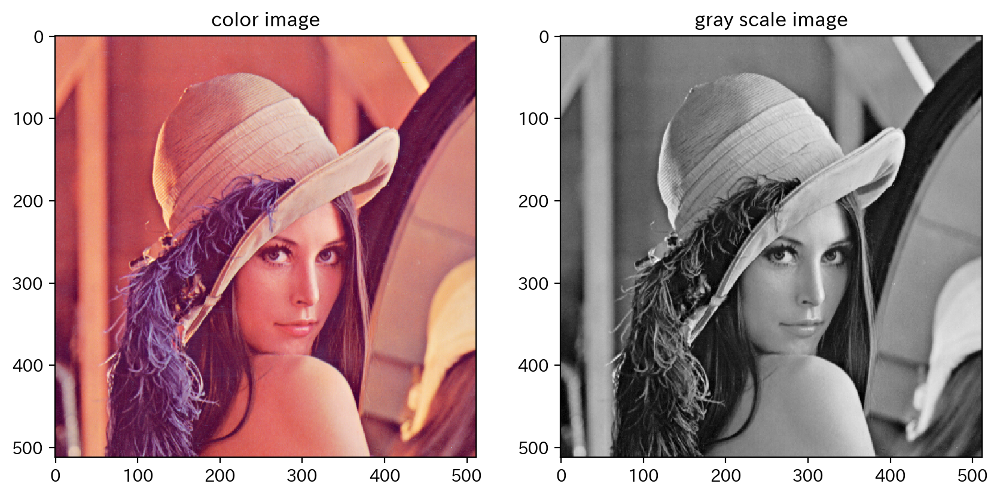

In [31]:
convert_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('color image')
ax1.imshow(convert_img)

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('gray scale image')
ax2.imshow(gray_img, cmap='gray')
plt.show()

## 拡大・縮小

元画像のサイズ
(512, 512, 3)
縮小画像のサイズ
(128, 128, 3)
拡大画像のサイズ
(2048, 2048, 3)


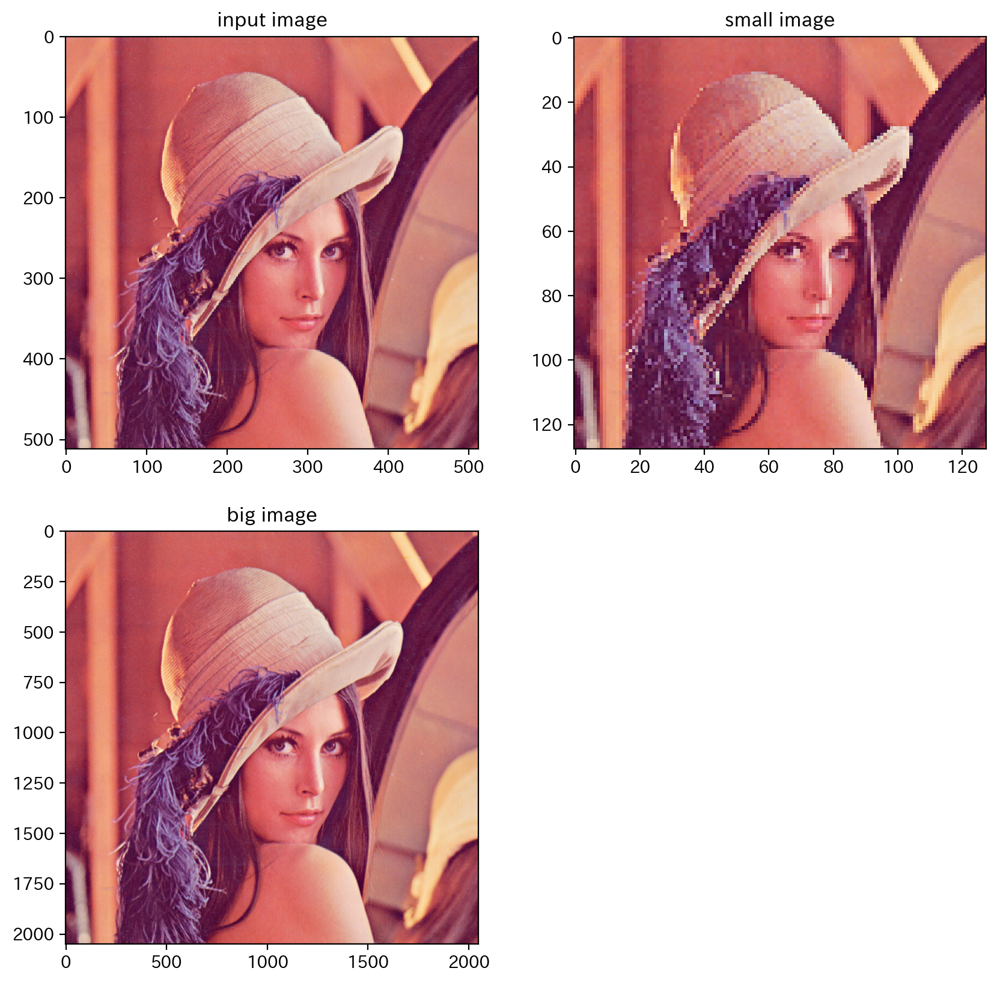

In [32]:
print("元画像のサイズ")
print(img.shape)
small_img = cv2.resize(convert_img, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_CUBIC)
print("縮小画像のサイズ")
print(small_img.shape)
big_img = cv2.resize(convert_img, None, fx=4.0, fy=4.0, interpolation=cv2.INTER_CUBIC)
print("拡大画像のサイズ")
print(big_img.shape)
fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(2,2,1)
ax1.set_title('input image')
ax1.imshow(convert_img)
ax2 = fig.add_subplot(2,2,2)
ax2.set_title('small image')
ax2.imshow(small_img)

ax3 = fig.add_subplot(2,2,3)
ax3.set_title('big image')
ax3.imshow(big_img, cmap='gray')
plt.show()

## 画像の保存

In [33]:
small_img = cv2.cvtColor(small_img, cv2.COLOR_RGB2BGR)
big_img = cv2.cvtColor(big_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("./img/small_img.png", small_img)
cv2.imwrite("./img/big_img.png", big_img)

True

## フィルタ処理

### ガウシアンフィルタ

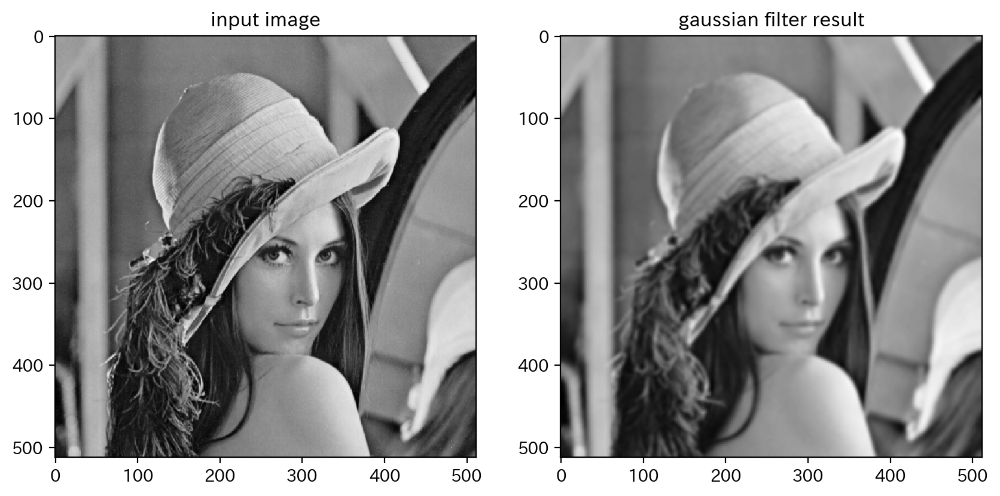

In [34]:
gaussian_img = cv2.GaussianBlur(gray_img,(11,11),0)

fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('input image')
ax1.imshow(gray_img, cmap='gray')

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('gaussian filter result')
ax2.imshow(gaussian_img, cmap='gray')
plt.show()
plt.show()

### Cannyフィルタ

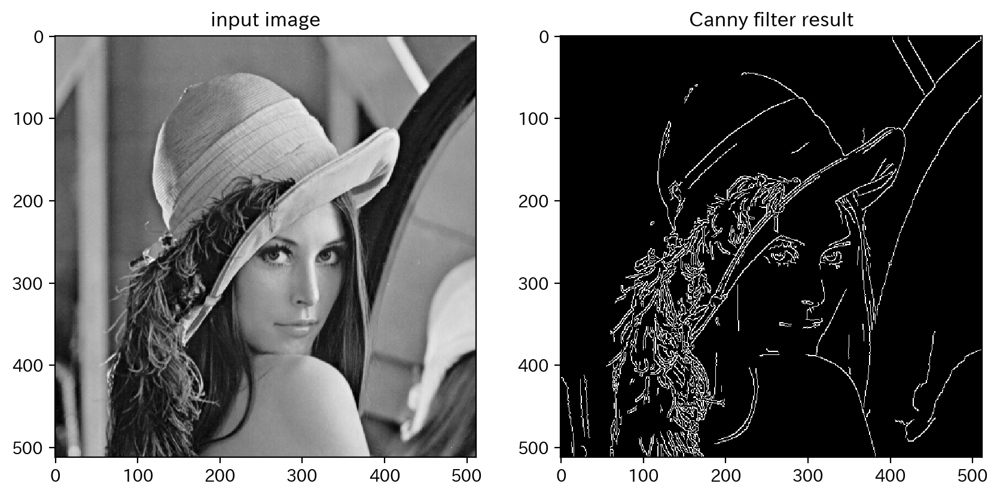

In [35]:
canny_img = cv2.Canny(gray_img, 100,200)

fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('input image')
ax1.imshow(gray_img, cmap='gray')

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('Canny filter result')
ax2.imshow(canny_img, cmap='gray')
plt.show()

### バイラテラルフィルタ

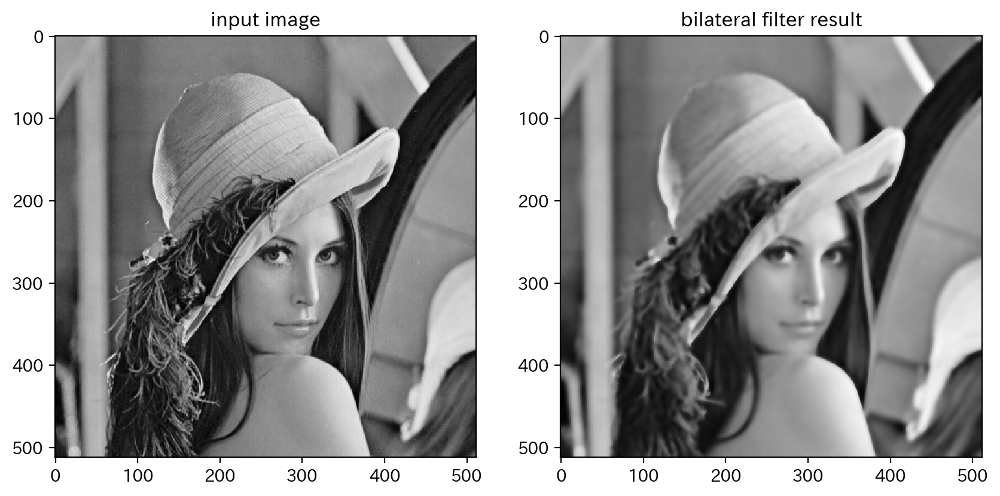

In [36]:
bilateral_img = cv2.bilateralFilter(gray_img,9,75,75)

fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('input image')
ax1.imshow(gray_img, cmap='gray')

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('bilateral filter result')
ax2.imshow(bilateral_img, cmap='gray')
plt.show()

## Sobel フィルタ

### フィルタのカーネル作成

In [37]:
x_kernel = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

y_kernel = x_kernel.T

print("x方向のsobelフィルタの係数")
print(x_kernel)
print("y方向のsobelフィルタの係数")
print(y_kernel)

x方向のsobelフィルタの係数
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]
y方向のsobelフィルタの係数
[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


### フィルタリング

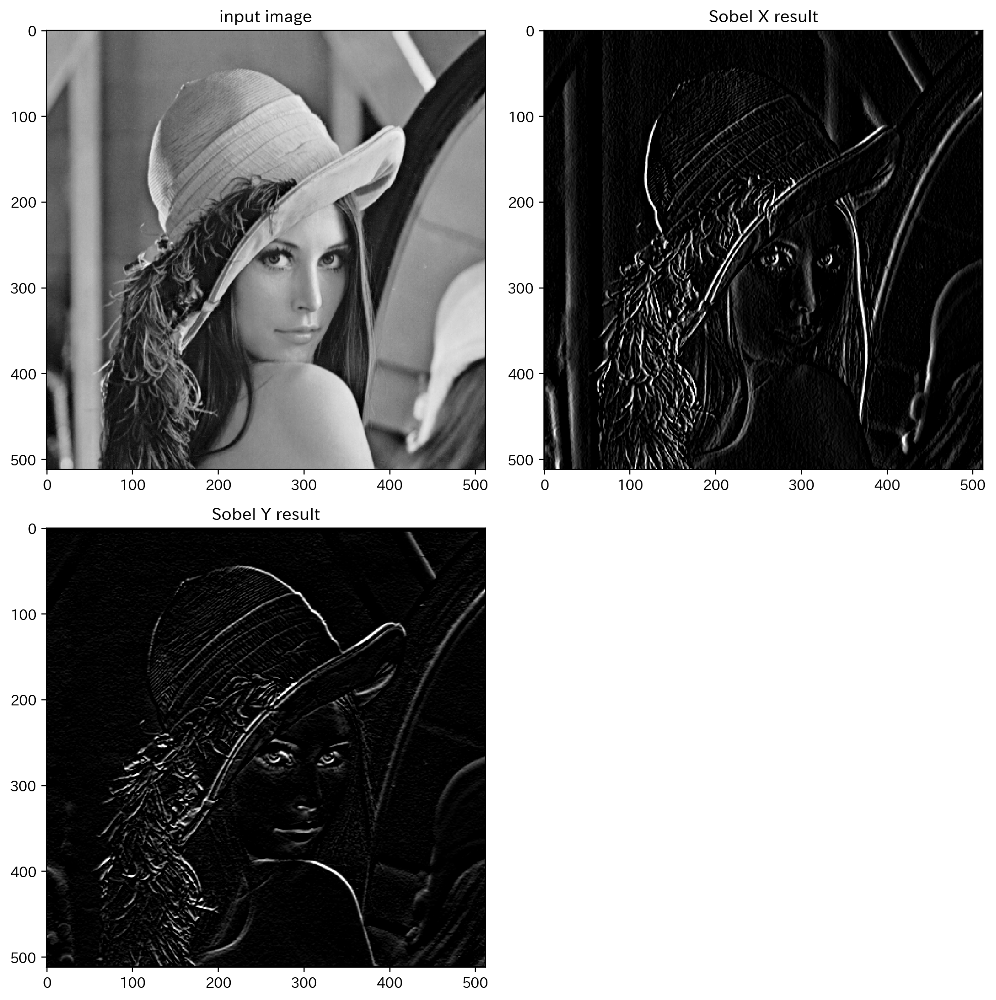

In [38]:
sobel_x_img = cv2.filter2D(gray_img, -1, x_kernel)
sobel_y_img = cv2.filter2D(gray_img, -1, y_kernel)

# 画像の表示処理
fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(2,2,1)
ax1.set_title('input image')
ax1.imshow(gray_img, cmap='gray')

ax2 = fig.add_subplot(2,2,2)
ax2.set_title('Sobel X result')
ax2.imshow(sobel_x_img, cmap='gray')

ax3 = fig.add_subplot(2,2,3)
ax3.set_title('Sobel Y result')
ax3.imshow(sobel_y_img, cmap='gray')

plt.tight_layout()
plt.show()

## ラプラシアンフィルタ

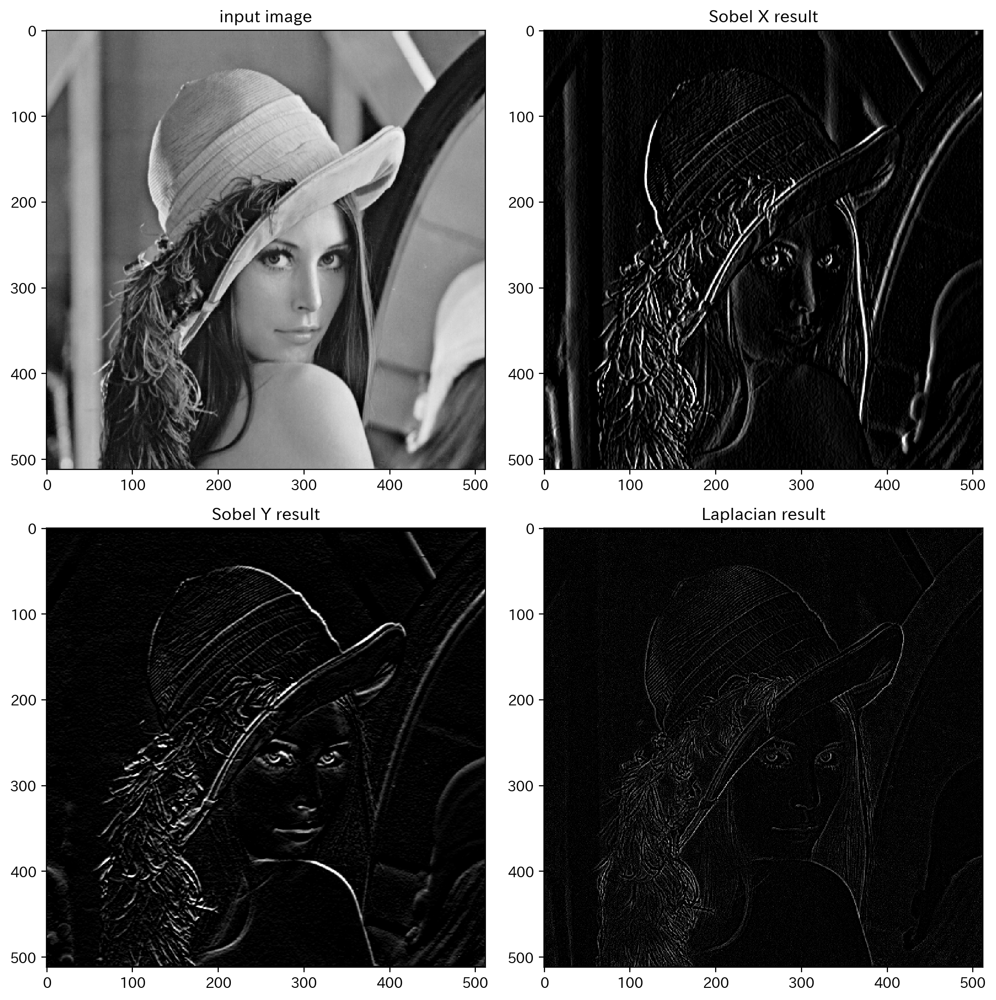

In [39]:
laplacian = cv2.Laplacian(gray_img,cv2.CV_8U, ksize=1)
sobelx = cv2.Sobel(gray_img,cv2.CV_8U,1,0,ksize=3)
sobely = cv2.Sobel(gray_img,cv2.CV_8U,0,1,ksize=3)

# 画像の表示処理
fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(2,2,1)
ax1.set_title('input image')
ax1.imshow(gray_img, cmap='gray')

ax2 = fig.add_subplot(2,2,2)
ax2.set_title('Sobel X result')
ax2.imshow(sobelx, cmap='gray')

ax3 = fig.add_subplot(2,2,3)
ax3.set_title('Sobel Y result')
ax3.imshow(sobely, cmap='gray')

ax3 = fig.add_subplot(2,2,4)
ax3.set_title('Laplacian result')
ax3.imshow(laplacian, cmap='gray')

plt.tight_layout()
plt.show()

## 色空間の変換

In [40]:
# BGR→YUV
yuv_img = cv2.cvtColor(img , cv2.COLOR_BGR2YUV)
# BGR→HSV
hsv_img = cv2.cvtColor(img , cv2.COLOR_BGR2HSV)
# BGR→RGB
rgb_img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
# BGR→グレースケール
gray_img = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)


## 画像の2値化

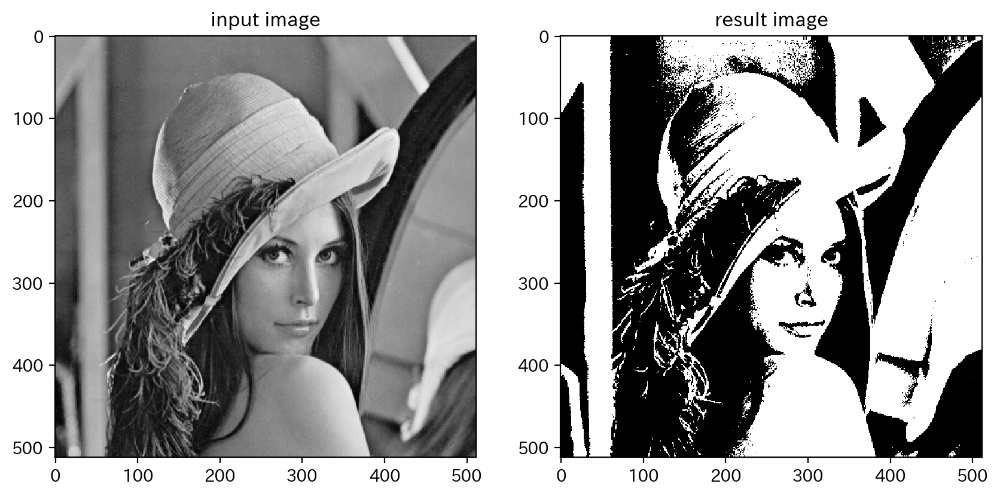

In [41]:
# 画像のしきい値処理を行う関数
ret, bi_img = cv2.threshold(gray_img, 125, 255, cv2.THRESH_BINARY)
# 画像の表示
fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('input image')
ax1.imshow(gray_img, cmap='gray')

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('result image')
ax2.imshow(bi_img, cmap='gray')
plt.show()

## マスク処理

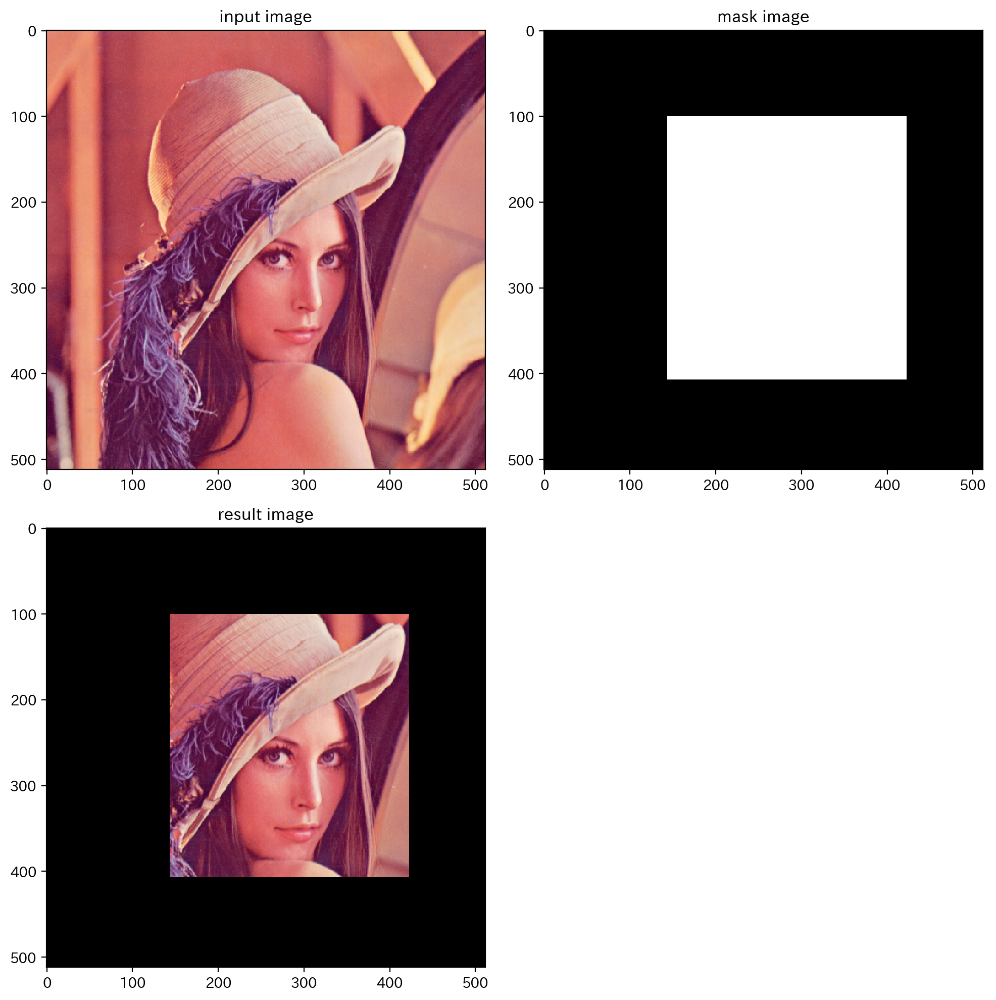

In [42]:
mask_img = cv2.imread('./img/mask.png')
masked_img = cv2.bitwise_and(convert_img, mask_img)
fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(2,2,1)
ax1.set_title('input image')
ax1.imshow(convert_img)

ax2 = fig.add_subplot(2,2,2)
ax2.set_title('mask image')
ax2.imshow(mask_img, cmap='gray')

ax3 = fig.add_subplot(2,2,3)
ax3.set_title('result image')
ax3.imshow(masked_img)

plt.tight_layout()
plt.show()

## しきい値処理による領域抽出

### 画像の読み込みと成分の抽出

In [43]:
# 画像の読み込み
color_circle_img = cv2.cvtColor(cv2.imread('./img/colorful.png'), cv2.COLOR_BGR2RGB)
# 色空間の変換
hsv_img = cv2.cvtColor(color_circle_img, cv2.COLOR_RGB2HSV)

# HSV色空間画像から、H成分の取り出し
h_img = hsv_img[:, :, 0]

### マスク画像の生成とマスク処理

In [44]:
## 画像サイズの取得
h, w, ch = color_circle_img.shape
# 入力画像と同じサイズの真っ白な画像を作成
mask_img2 = np.ones((h, w), dtype=np.uint8)

# H成分のしきい値処理
# 画素の走査
for y in range(h):
    for x in range(w):
        # しきい値処理
        if h_img[y, x] < 90 or h_img[y, x] > 140:
            mask_img2[y, x] = 0
        else:
            pass

# 簡単なしきい値処理の書き方
# mask_img2[h_img < 90] = 0
# mask_img2[h_img > 140] = 0

# マスク処理
masked_img = cv2.bitwise_and(color_circle_img, color_circle_img, mask=mask_img2)

### 画像の表示

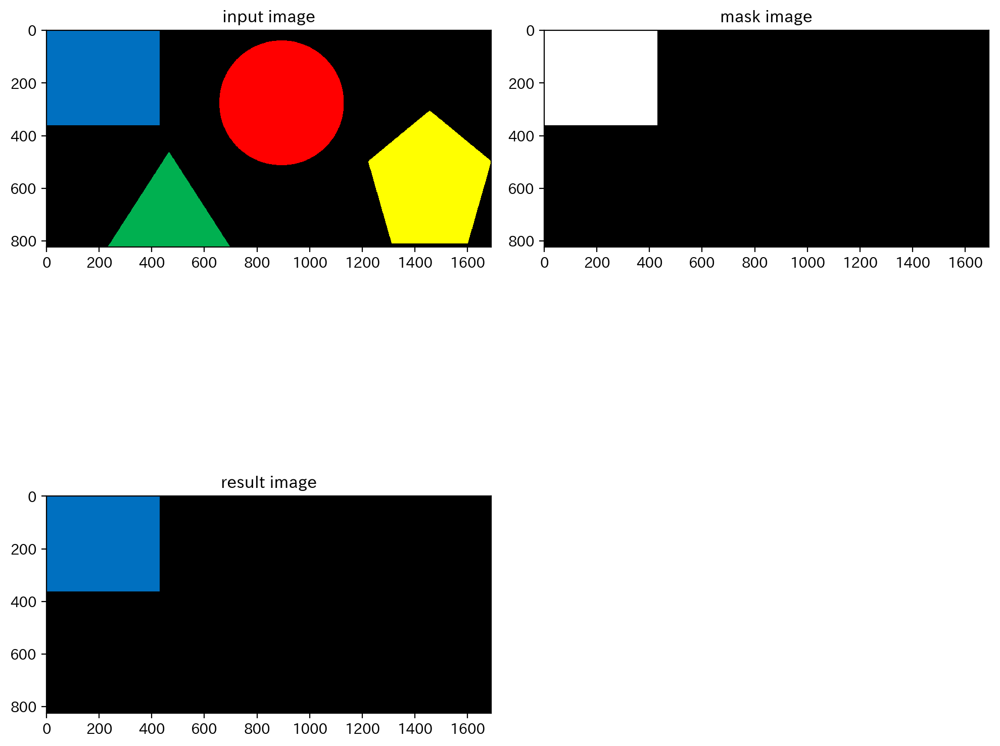

In [45]:
fig = plt.figure(figsize=(10,10),dpi=200)
ax1 = fig.add_subplot(2,2,1)
ax1.set_title('input image')
ax1.imshow(color_circle_img)

ax2 = fig.add_subplot(2,2,2)
ax2.set_title('mask image')
ax2.imshow(mask_img2, cmap='gray')

ax3 = fig.add_subplot(2,2,3)
ax3.set_title('result image')
ax3.imshow(masked_img)
plt.tight_layout()
plt.show()